# **영상 전처리 및 필터링**

## **1. 실습 환경 구축**

- 데이터/이미지 파일 다운로드

In [ ]:
!mkdir images

mkdir: cannot create directory ‘images’: File exists


In [ ]:
!wget https://raw.githubusercontent.com/SkyLectures/SkyLectures.github.io/main/materials/ai/images/S03-02-03-02_01-001.jpg -O ./images/traffic_light.jpg

--2025-11-15 15:20:17--  https://raw.githubusercontent.com/SkyLectures/SkyLectures.github.io/main/materials/ai/images/S03-02-03-02_01-001.jpg
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 676844 (661K) [image/jpeg]
Saving to: ‘./images/traffic_light.jpg’

./images/traffic_li 100%[===================>] 660.98K  --.-KB/s    in 0.04s   

2025-11-15 15:20:17 (14.6 MB/s) - ‘./images/traffic_light.jpg’ saved [676844/676844]



- 경고메시지 무시

In [ ]:
import warnings
warnings.filterwarnings('ignore')

- 한글 폰트 설정

In [ ]:
!apt install fonts-nanum

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
fonts-nanum is already the newest version (20200506-1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.


In [ ]:
import matplotlib.font_manager as fm
import matplotlib.pyplot as plt

In [ ]:
fm.fontManager.addfont('/usr/share/fonts/truetype/nanum/NanumBarunGothic.ttf')
plt.rcParams['font.family'] = "NanumBarunGothic"

- 음수 부호 설정

In [ ]:
plt.rc("axes", unicode_minus = False)

## **2. 기본적인 영상 전처리 기법**

In [ ]:
import cv2
import numpy as np

In [ ]:
# 이미지 불러오기
img_color = cv2.imread('./images/traffic_light.jpg')

### 2.1 색상 공간 변환

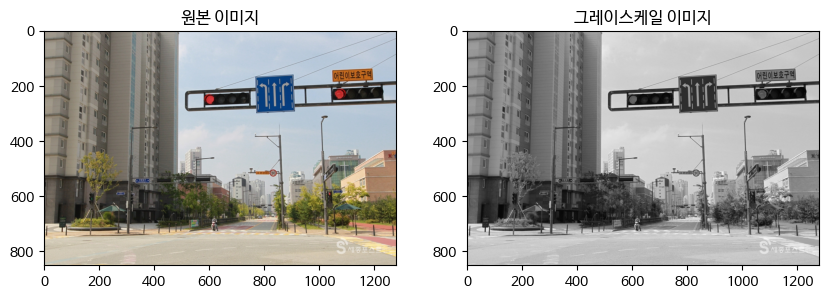

In [ ]:
# BGR을 그레이스케일로 변환
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

# 결과 표시
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(122), plt.imshow(img_gray, cmap='gray'), plt.title('그레이스케일 이미지')
plt.show()

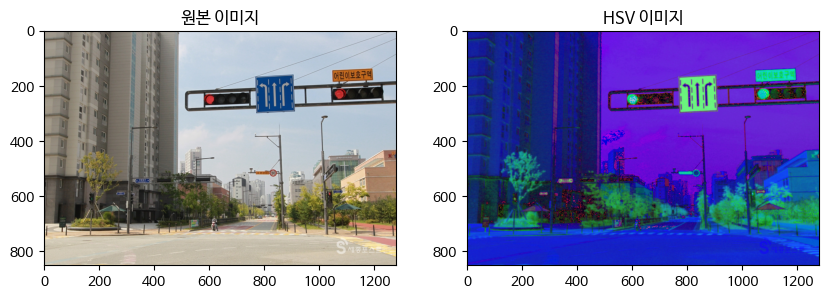

In [ ]:
# BGR을 HSV로 변환
img_hsv = cv2.cvtColor(img_color, cv2.COLOR_BGR2HSV)

# 결과 표시
plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(122), plt.imshow(img_hsv, cmap='gray'), plt.title('HSV 이미지')
plt.show()

### 2.2 이미지 크기 조정

- CoLab에서는 사용자가 보기 편하게 이미지의 크기 등을 임의 조정하고 있으므로 좌표의 크기를 잘 살펴볼 것

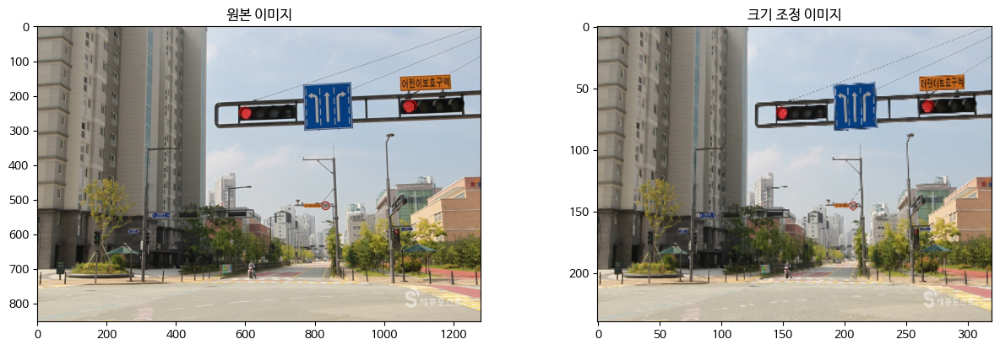

In [ ]:
resized = cv2.resize(img_color, (320, 240))

# 결과 표시
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(222), plt.imshow(cv2.cvtColor(resized, cv2.COLOR_BGR2RGB)), plt.title('크기 조정 이미지')
plt.show()

절반 크기 이미지 형태: (426, 640, 3)


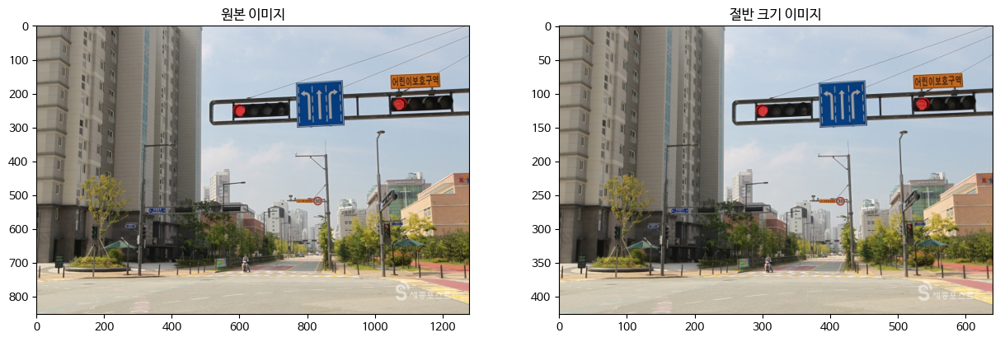

In [ ]:
# 이미지 절반 크기로 줄이기 (가로/세로 0.5배)
img_resized_half = cv2.resize(img_color, (0, 0), fx=0.5, fy=0.5, interpolation=cv2.INTER_AREA)
print(f"절반 크기 이미지 형태: {img_resized_half.shape}")

# 결과 표시
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(222), plt.imshow(cv2.cvtColor(img_resized_half, cv2.COLOR_BGR2RGB)), plt.title('절반 크기 이미지')
plt.show()

두 배 크기 이미지 형태: (1706, 2560, 3)


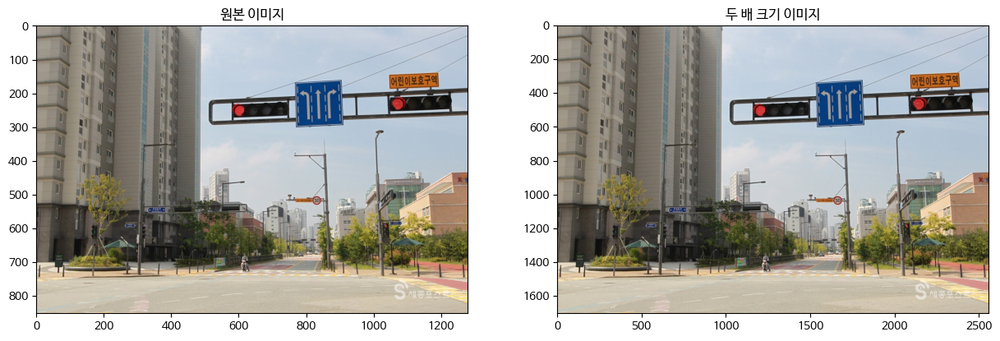

In [ ]:
# 이미지 두 배 크기로 늘리기 (가로/세로 2배)
img_resized_double = cv2.resize(img_color, (0, 0), fx=2, fy=2, interpolation=cv2.INTER_CUBIC)
print(f"두 배 크기 이미지 형태: {img_resized_double.shape}")

# 결과 표시
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(222), plt.imshow(cv2.cvtColor(img_resized_double, cv2.COLOR_BGR2RGB)), plt.title('두 배 크기 이미지')
plt.show()

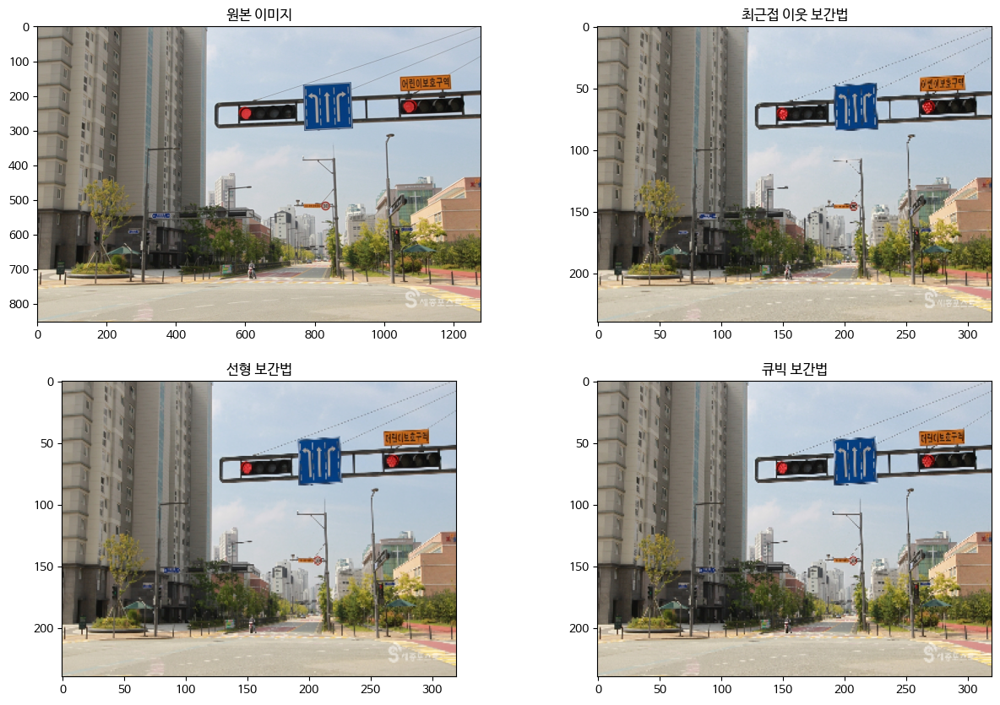

In [ ]:
# 다양한 보간법 적용
resized_nearest = cv2.resize(img_color, (320, 240), interpolation=cv2.INTER_NEAREST)    # 최근접 이웃 보간법
resized_linear = cv2.resize(img_color, (320, 240), interpolation=cv2.INTER_LINEAR)          # 선형 보간법
resized_cubic = cv2.resize(img_color, (320, 240), interpolation=cv2.INTER_CUBIC)            # 큐빅 보간법

# 결과 표시
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(222), plt.imshow(cv2.cvtColor(resized_nearest, cv2.COLOR_BGR2RGB)), plt.title('최근접 이웃 보간법')
plt.subplot(223), plt.imshow(cv2.cvtColor(resized_linear, cv2.COLOR_BGR2RGB)), plt.title('선형 보간법')
plt.subplot(224), plt.imshow(cv2.cvtColor(resized_cubic, cv2.COLOR_BGR2RGB)), plt.title('큐빅 보간법')
plt.show()

### 2.3 관심 영역 설정/추출

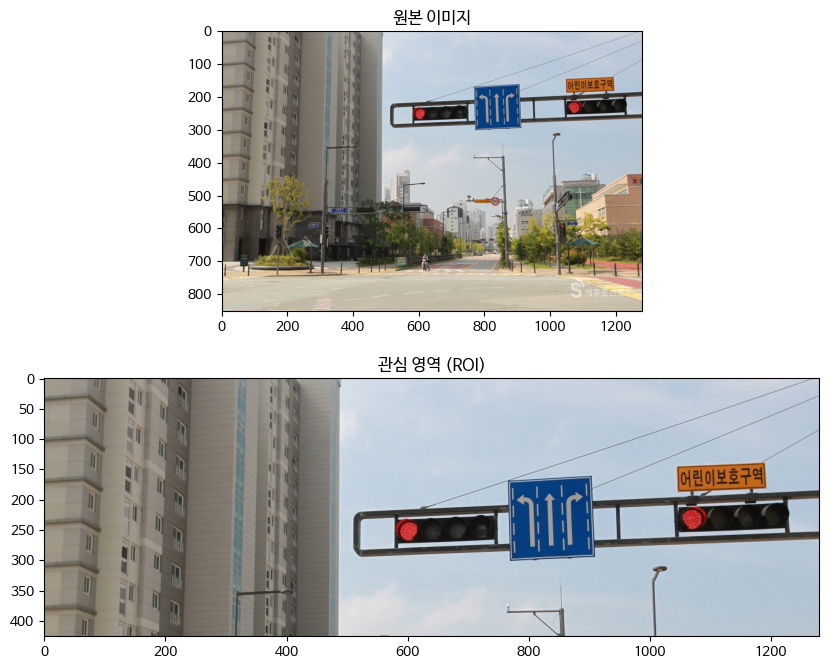

In [ ]:
# 이미지 상단 절반을 ROI로 설정 (신호등 영역이라고 가정)
height, width = img_color.shape[:2]
roi_start_y = 0
roi_end_y = int(height * 0.5)  # 이미지 높이의 절반까지
roi = img_color[roi_start_y:roi_end_y, 0:width]

# 결과 표시
plt.figure(figsize=(10, 8))
plt.subplot(211), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(212), plt.imshow(cv2.cvtColor(roi, cv2.COLOR_BGR2RGB)), plt.title('관심 영역 (ROI)')
plt.show()

### 2.4 픽셀 접근 및 수정

우측 하단 픽셀 (BGR): [165 188 196]


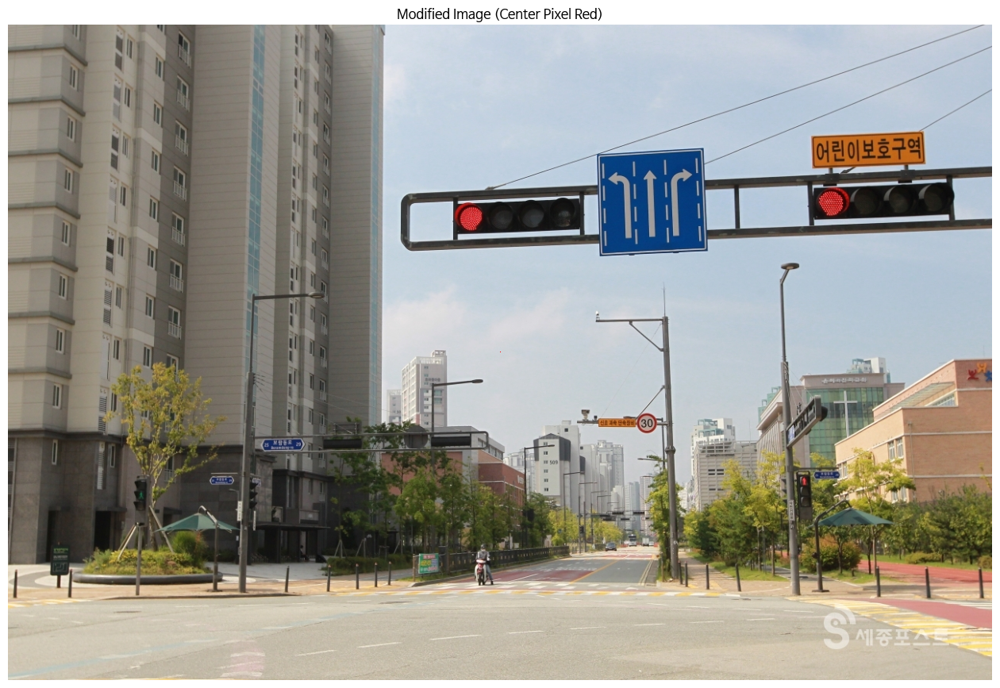

In [ ]:
bottom_right_pixel = img_color[img_color.shape[0] - 1, img_color.shape[1] - 1]
print(f"우측 하단 픽셀 (BGR): {bottom_right_pixel}")

center_y, center_x = img_color.shape[0] // 2, img_color.shape[1] // 2
img_color[center_y, center_x] = [0, 0, 255]

# Matplotlib으로 이미지를 표시하기 위해 BGR에서 RGB로 색상 변환
img_rgb_modified = cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(16, 12)) # 이미지 크기 조절 (선택 사항)
plt.imshow(img_rgb_modified)
plt.title('Modified Image (Center Pixel Red)')
plt.axis('off') # 축 정보 숨기기
plt.show()

## **3. OpenCV를 이용한 기본 영상 처리**

### 3.1 이미지 이진화

이진화 반환 값 (ret): 127.0


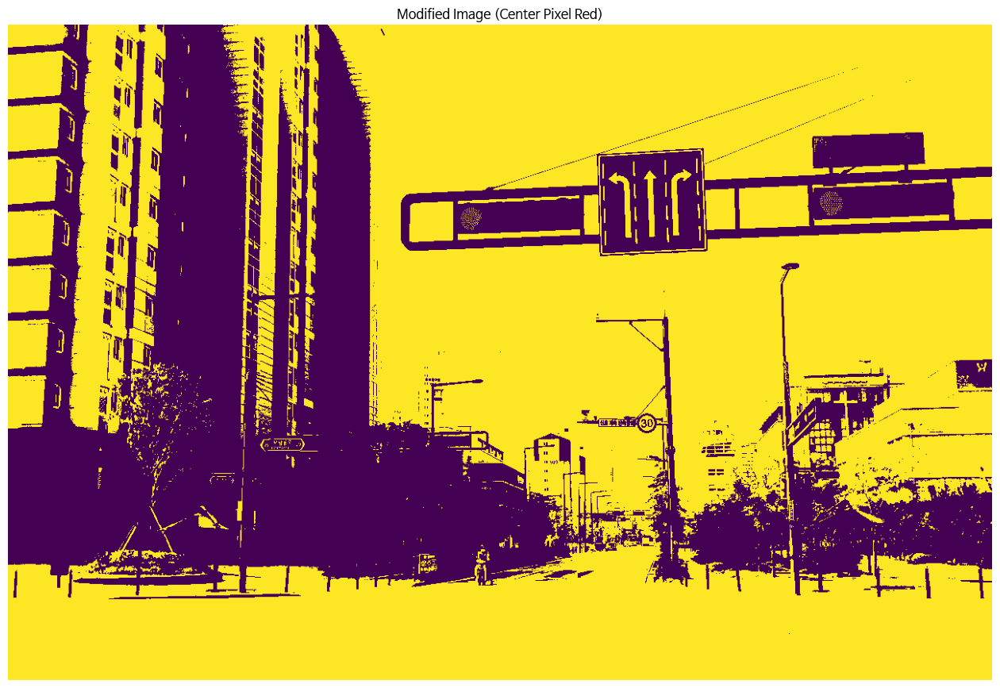

In [ ]:
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)

# 전역 이진화: 127을 임계값으로 사용
# 127보다 크면 255(흰색), 작거나 같으면 0(검은색)
ret, img_binary = cv2.threshold(img_gray, 127, 255, cv2.THRESH_BINARY)

# 이진화 결과도 종종 유용한 정보를 포함함
print(f"이진화 반환 값 (ret): {ret}")

plt.figure(figsize=(16, 12)) # 이미지 크기 조절 (선택 사항)
plt.imshow(img_binary)
plt.title('Modified Image (Center Pixel Red)')
plt.axis('off') # 축 정보 숨기기
plt.show()

- CoLab에서는 Matplotlib를 통해 이미지를 표현하고 있으며,
- Python에서 사용하는 Matplotlib의 기본 컬러맵은 viridis 또는 plasma 계열을 사용함
- 이 컬러맵은 데이터의 최소값을 파란색/보라색 계열의 값에, 최대값을 노란색/초록색 계열의 값에 매핑하고 있음
- 그래서 흰색-검은색이 아닌 다른 색상으로 표시되고 있음

### 3.2 이미지 블러링

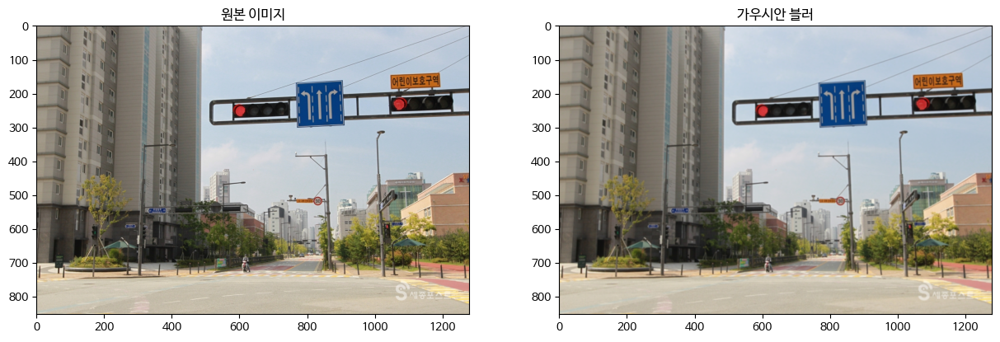

In [ ]:
# 가우시안 블러 (5x5 커널 크기)
img_blur = cv2.GaussianBlur(img_color, (5, 5), 0)

# 결과 표시
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(222), plt.imshow(cv2.cvtColor(img_blur, cv2.COLOR_BGR2RGB)), plt.title('가우시안 블러')
plt.show()

### 3,3 엣지(Edge) 검출

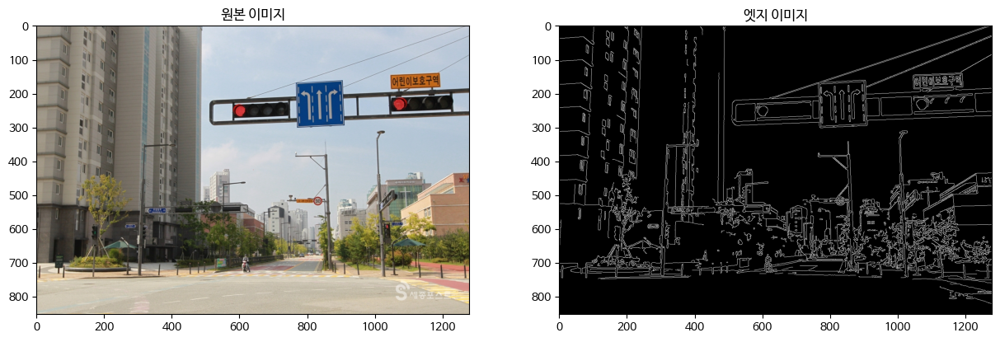

In [ ]:
img_gray = cv2.cvtColor(img_color, cv2.COLOR_BGR2GRAY)
img_blur = cv2.GaussianBlur(img_gray, (5, 5), 0) # 노이즈 제거 후 에지 검출

# Canny 에지 검출 (하위 임계값=50, 상위 임계값=150)
img_edges = cv2.Canny(img_blur, 50, 150)

# 결과 표시
plt.figure(figsize=(15, 10))
plt.subplot(221), plt.imshow(cv2.cvtColor(img_color, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(222), plt.imshow(cv2.cvtColor(img_edges, cv2.COLOR_BGR2RGB)), plt.title('엣지 이미지')
plt.show()

## **4. 이미지 품질 향상 기법**

### 4.1 히스토그램 평활화

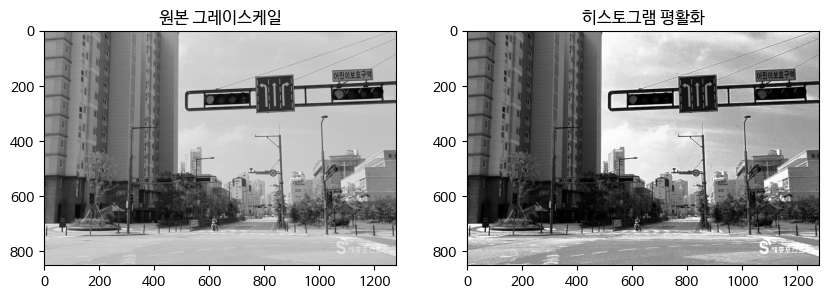

In [ ]:
# 그레이스케일 이미지에 적용
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
equalized_img = cv2.equalizeHist(gray_img)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(gray_img, cmap='gray'), plt.title('원본 그레이스케일')
plt.subplot(122), plt.imshow(equalized_img, cmap='gray'), plt.title('히스토그램 평활화')
plt.show()

### 4.2 노이즈 제거 필터링

#### 4.2.1 평균 블러(Averaging Blur)

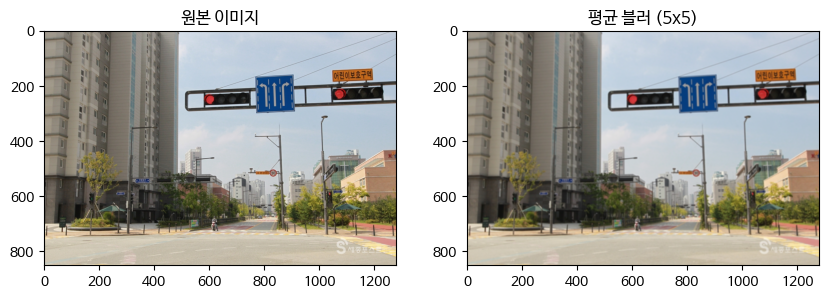

In [ ]:
# 5x5 커널을 사용한 평균 블러
blur_avg = cv2.blur(img, (5, 5))

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(122), plt.imshow(cv2.cvtColor(blur_avg, cv2.COLOR_BGR2RGB)), plt.title('평균 블러 (5x5)')
plt.show()

#### 4.2.2 가우시안 블러(Gaussian Blur)

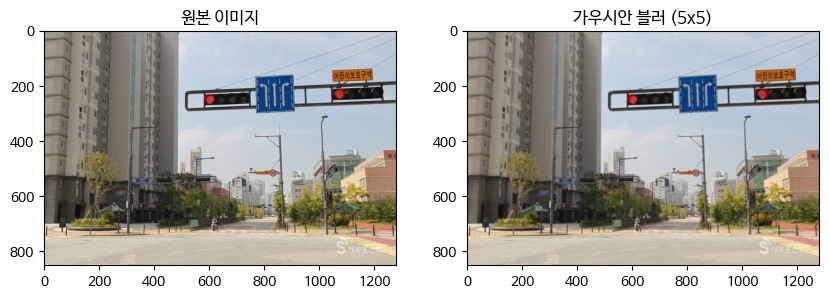

In [ ]:
# 5x5 커널, 시그마 X/Y = 0을 사용한 가우시안 블러
blur_gaussian = cv2.GaussianBlur(img, (5, 5), 0)

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(122), plt.imshow(cv2.cvtColor(blur_gaussian, cv2.COLOR_BGR2RGB)), plt.title('가우시안 블러 (5x5)')
plt.show()

#### 4.2.3 미디언 블러(Median Blur)

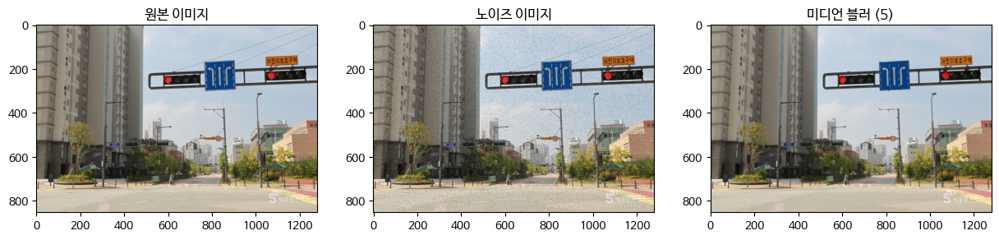

In [ ]:
# 소금-후추 노이즈를 가진 이미지 생성 (테스트용)
noisy_img = img.copy()
num_salt = int(img.size * 0.005) # 0.5% 소금 노이즈
coords = [np.random.randint(0, i - 1, num_salt) for i in noisy_img.shape]
noisy_img[coords[0], coords[1], :] = 255
num_pepper = int(img.size * 0.005) # 0.5% 후추 노이즈
coords = [np.random.randint(0, i - 1, num_pepper) for i in noisy_img.shape]
noisy_img[coords[0], coords[1], :] = 0

# 5x5 커널을 사용한 미디언 블러
blur_median = cv2.medianBlur(noisy_img, 5) # 커널 크기는 홀수여야 함

plt.figure(figsize=(15, 5))
plt.subplot(131), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(132), plt.imshow(cv2.cvtColor(noisy_img, cv2.COLOR_BGR2RGB)), plt.title('노이즈 이미지')
plt.subplot(133), plt.imshow(cv2.cvtColor(blur_median, cv2.COLOR_BGR2RGB)), plt.title('미디언 블러 (5)')
plt.show()

### 4.3 이미지 선명화

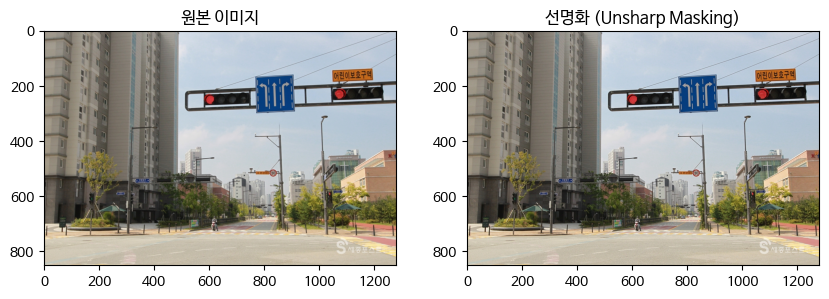

In [ ]:
# 5x5 커널, 시그마 X/Y = 0을 사용한 가우시안 블러 (흐린 이미지 생성)
blurred = cv2.GaussianBlur(img, (5, 5), 0)

# 원본 - 흐린 이미지 = 엣지 강조 이미지 (마스크)
# 이미지 데이터 타입이 uint8이므로 연산 시 주의 (np.float32로 변환 후 연산)
unsharp_mask = cv2.addWeighted(img, 1.5, blurred, -0.5, 0) # 원본에 1.5배, 블러된 이미지에 -0.5배 가중치를 주고 0을 더함

plt.figure(figsize=(10, 5))
plt.subplot(121), plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB)), plt.title('원본 이미지')
plt.subplot(122), plt.imshow(cv2.cvtColor(unsharp_mask, cv2.COLOR_BGR2RGB)), plt.title('선명화 (Unsharp Masking)')
plt.show()